In [15]:
# !pip install haversine
!pip install geopy noisereduce

You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [16]:
# from src.gen_short import MEL_Generator_Short, Mel_Provider

In [19]:
import os
import shutil
import warnings

import numpy as np
import pandas as pd
import torchaudio

warnings.filterwarnings(action="ignore")
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"
import json

import geopandas
import librosa
import librosa.display
import matplotlib.pyplot as plt
import scipy.stats as st
import soundfile
import tensorflow as tf
import torch
import IPython.display as ipd
%matplotlib inline
from PIL import Image
from tensorflow import keras
from tensorflow.keras.optimizers import Adam
from tqdm import tqdm
import seaborn as sns
from geopy.distance import geodesic
#     import geodesic

In [20]:
all_audio_init = pd.read_csv("/app/_data/all_audio_initial.csv")
SEED = 42
IMG_SIZE = 260
SAMPLE_RATE = 32000
N_FFT = 2048
SIGNAL_LENGTH = 5  # seconds
FREQ_MIN = 500
FREQ_MAX = 15000
MAX_AUDIO_FILES = 100
WIN_LENGHT = 1024
AUDIO_PATH = "/app/_data/train_short_audio/"
BATCH_SIZE = 128

In [6]:
# all_audio_init[all_audio_init["duration"] > 60]

# stat of call/nocall

In [7]:
nocall = all_audio_init[all_audio_init["primary_label"] == "nocall"]
nocall["end_sec"] = nocall["row_id"].apply(lambda x: int(x.split("_")[-1]))

with_call = all_audio_init[(all_audio_init["primary_label"] != "nocall")&(all_audio_init["rating"]==6)]
with_call["end_sec"] = with_call["row_id"].apply(lambda x: int(x.split("_")[-1]))

In [8]:
nocall = nocall.reset_index(drop=True)
with_call = with_call.reset_index(drop=True)

In [73]:
ms = Mel_Provider(
    n_fft=N_FFT,
    win_length=WIN_LENGHT,
    n_mels=IMG_SIZE,
    sample_rate=SAMPLE_RATE,
    mel_image_size=IMG_SIZE,
    min_frequency=FREQ_MIN,
    max_frequency=FREQ_MAX,
    signal_lenght=SIGNAL_LENGTH,
)

In [59]:
# nocall_sample = nocall.sample(100).reset_index(drop=True)

In [61]:
# list_mels = []
# # plt.figure(figsize=(20, 10))
# for i, ix in enumerate(range(10, 20)):
#     filepath = nocall_sample.loc[ix, "file_path"]
#     end_sec = nocall_sample.loc[ix, "end_sec"]
#     wave, sr = librosa.load(filepath, sr=SAMPLE_RATE)
#     end = int(end_sec * SAMPLE_RATE)
#     end = end if end < len(wave) else len(wave)
#     start = int(end - (5 * SAMPLE_RATE))
#     wave = wave[start:end]
#     ipd.Audio(wave, rate=32000)
#     mel = ms.msg(wave)
#     list_mels.append(mel)
# #     plt.subplot(2, 5, i + 1)
#     plt.imshow(mel)
#     plt.show()
# # plt.show();

In [75]:
list_mels_calls = []
for ix in with_call.index.tolist():
    filepath = with_call.loc[ix, "file_path"]
    end_sec = with_call.loc[ix, "end_sec"]
    wave, sr = librosa.load(filepath, sr=SAMPLE_RATE)
    end = int(end_sec * SAMPLE_RATE)
    end = end if end < len(wave) else len(wave)
    start = int(end - (5 * SAMPLE_RATE))
    wave = wave[start:end]
    mel = ms.msg(wave)
    list_mels_calls.append(mel)


In [76]:
df_call = pd.DataFrame(
    columns=["mean", "std", "median", "sum", "p_10", "p_25", "p_75", "p_90"]
)
for i in range(len(list_mels_calls)):
    arr = list_mels_calls[i]
    df_call = df_call.append(
        {
            "mean": arr.mean(),
            "std": arr.std(),
            "median": np.percentile(arr, 50),
            "sum": arr.sum(),
            "p_10": np.percentile(arr, 10),
            "p_25": np.percentile(arr, 25),
            "p_75": np.percentile(arr, 75),
            "p_90": np.percentile(arr, 90),
        }, ignore_index=True
    )

In [68]:
df_nocall.to_csv('/app/_data/nocall_stat.csv', index=False)

In [77]:
df_call.to_csv('/app/_data/call_stat.csv', index=False)

In [80]:
df_nocall['labels'] = 'nocall'
df_call['labels'] = 'call'

In [81]:
df_all = pd.concat([df_nocall, df_call], axis=0, ignore_index=True)

In [114]:
import sklearn
model = sklearn.cluster.KMeans(n_clusters=2, random_state=12345)
model.fit(df_all[df_all.columns[:-1]])

print("Центроиды кластеров:")
print(model.cluster_centers_)

KMeans(n_clusters=2, random_state=12345)

Центроиды кластеров:
[[6.01252524e-01 1.36836542e-01 5.93992465e-01 4.06446706e+04
  4.50251968e-01 5.10981699e-01 6.98561395e-01 7.83871810e-01]
 [5.28651884e-01 1.42391437e-01 5.01409750e-01 3.57368673e+04
  3.80160523e-01 4.31745895e-01 6.29196089e-01 7.35147857e-01]]


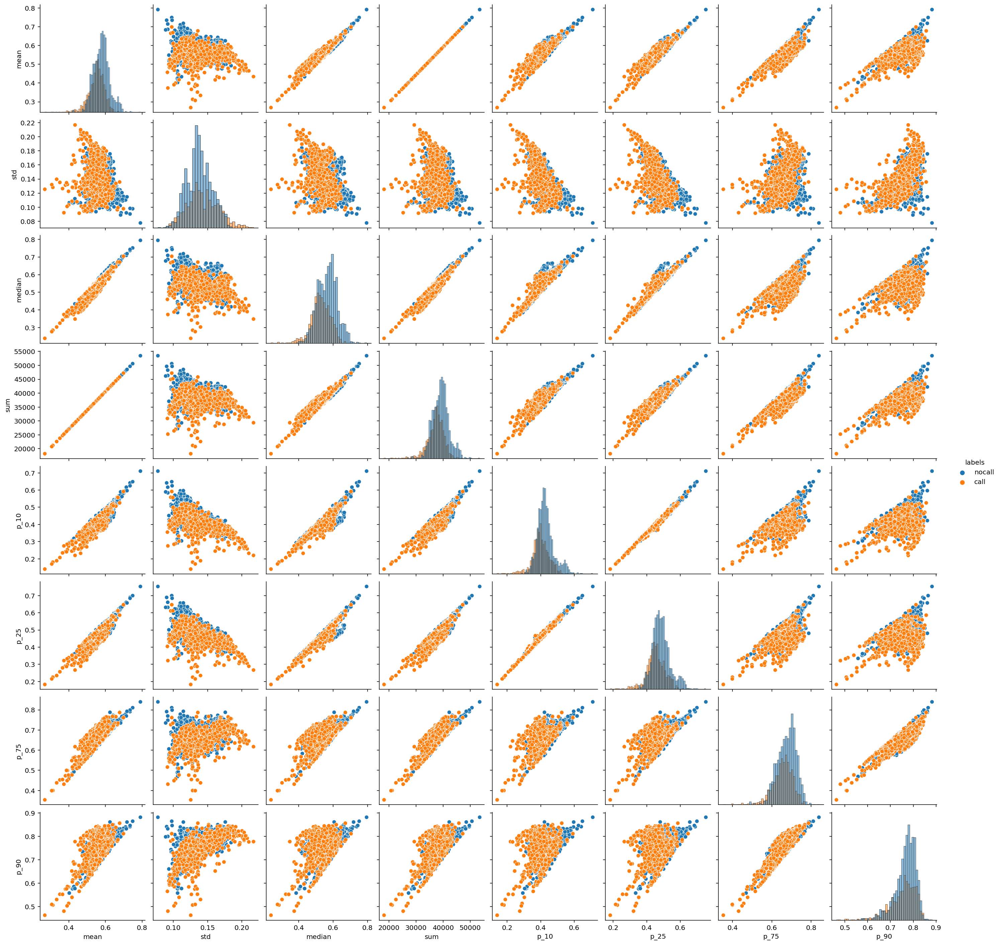

In [119]:
sns.pairplot(df_all, diag_kind='hist', hue='labels') 

# sites

In [21]:
coord_sites = pd.read_csv('/app/_data/coord_sites.csv')
coord_sites

,longitude,latitude,site,geometry
0,-84.51,10.12,COR,POINT (-84.51000000000001 10.12)
1,-119.95,38.49,SNE,POINT (-119.95 38.49)
2,-76.45,42.47,SSW,POINT (-76.45 42.47)
3,-75.85,5.57,COL,POINT (-75.84999999999999 5.57)


In [22]:
dict_coord = {}
for i in coord_sites[coord_sites.columns[:3]].values:
    dict_coord[i[2]] = np.array([i[1], i[0]])


In [23]:
dict_coord

{'COR': array([ 10.12, -84.51]),
 'SNE': array([  38.49, -119.95]),
 'SSW': array([ 42.47, -76.45]),
 'COL': array([  5.57, -75.85])}

In [24]:
all_audio_init['latitude'].describe()

count    65265.000000
mean        24.542058
std         21.920619
min        -53.162000
25%          6.983400
50%         31.741400
75%         41.697000
max         78.928100
Name: latitude, dtype: float64

In [25]:
for i in tqdm(all_audio_init.index.tolist()):
    coord = all_audio_init.loc[i, ['latitude', 'longitude']].values
    all_audio_init.loc[i, 'dist_COR'] = geodesic(coord, dict_coord['COR']).miles
    all_audio_init.loc[i, 'dist_SNE'] = geodesic(coord, dict_coord['SNE']).miles
    all_audio_init.loc[i, 'dist_SSW'] = geodesic(coord, dict_coord['SSW']).miles
    all_audio_init.loc[i, 'dist_COL'] = geodesic(coord, dict_coord['COL']).miles
    

100%|██████████| 65265/65265 [05:18<00:00, 204.62it/s]


In [26]:
all_audio_init.to_csv('/app/_data/all_audio_initial.csv', index=False)

In [193]:
COR_500 = sorted(all_audio_init[all_audio_init['dist_COR']<=500]['primary_label'].unique())
SNE_500 = sorted(all_audio_init[all_audio_init['dist_SNE']<=500]['primary_label'].unique())
SSW_500 = sorted(all_audio_init[all_audio_init['dist_SSW']<=500]['primary_label'].unique())
COL_500 = sorted(all_audio_init[all_audio_init['dist_COL']<=500]['primary_label'].unique())


In [194]:
ALL_500 = set(COR_500+SNE_500+SSW_500+COL_500)

In [195]:
len(ALL_500)

393

# distance and months

In [80]:
all_audio = pd.read_csv('/app/_data/all_audio_initial_distance.csv')

In [81]:
coord_sites = pd.read_csv('/app/_data/coord_sites.csv')
dates_sites = pd.read_csv('/app/_data/dates_sites.csv', parse_dates=[5,6])

In [82]:
dates = pd.read_csv('/app/_data/test_soundscapes/test_set_recording_dates.csv')
dates['date'] = pd.to_datetime(dates['date'], format='%Y%m%d')
dates['month'] = dates['date'].dt.month
dates['year'] = dates['date'].dt.year

In [83]:
# dates

In [84]:
sites = dates_sites[['site', 'min_month', 'max_month', 'min_year']].merge(coord_sites[['latitude', 'longitude', 'site']], on='site')
sites

,site,min_month,max_month,min_year,latitude,longitude
0,COL,9,11,2019,5.57,-75.85
1,COR,9,10,2019,10.12,-84.51
2,SNE,5,5,2018,38.49,-119.95
3,SSW,2,8,2017,42.47,-76.45


In [85]:
def choose_ids(distance_delta=500, months_delta=2, years_delta=5, start_year = 2007):
    import pandas as pd
    distances_df = pd.read_csv("/app/_data/distances.csv")
#     dates_sites = pd.read_csv('/app/_data/dates_sites.csv')
    df = distances_df.query('dist_COR <= @distance_delta or dist_SNE <= @distance_delta or dist_SSW <= @distance_delta or dist_COL <= @distance_delta')
    df = df.query('year >= @start_year').reset_index(drop=True)
    list_filenames = df['filename'].unique().tolist()
    return df, list_filenames

In [86]:
_, list_filenames = choose_ids(1000)

In [87]:
audio_df = all_audio.query('filename in @list_filenames')

In [88]:
COR_500 = audio_df[audio_df['dist_COR']<=1000]
COL_500 = audio_df[audio_df['dist_COL']<=1000]
SNE_500 = audio_df[audio_df['dist_SNE']<=1000]
SSW_500 = audio_df[audio_df['dist_SSW']<=1000]

In [89]:
COR_500['month'].unique()

array([ 1,  6, 11, 12,  2,  4,  3, 10,  9,  7,  8,  5])

In [90]:
cor_monts = [8,9,10,11]
col_monts = [8,9,10,11,12]
sne_monts = [4,5,6]
ssw_monts = [1,2,3,4,5,6,7,8,9]


In [91]:
COR_500.query('month in @cor_monts').primary_label.unique().shape

(261,)

In [92]:
COL_500.query('month in @col_monts').primary_label.unique().shape
SNE_500.query('month in @sne_monts').primary_label.unique().shape
SSW_500.query('month in @ssw_monts').primary_label.unique().shape

(252,)

(224,)

(181,)

## cor

In [93]:
COR_birds = COR_500.query('month in @cor_monts').primary_label.unique()
COR = COR_500.query('month in @cor_monts').reset_index(drop=True)

In [94]:
cor_filename = COR['filename'].tolist()
audio_not_in_cor = all_audio.query('filename not in @cor_filename and month in @cor_monts')

/app/_data/train_short_audio/amekes/XC308302.ogg /app/_data/train_short_audio/amekes/XC443522.ogg


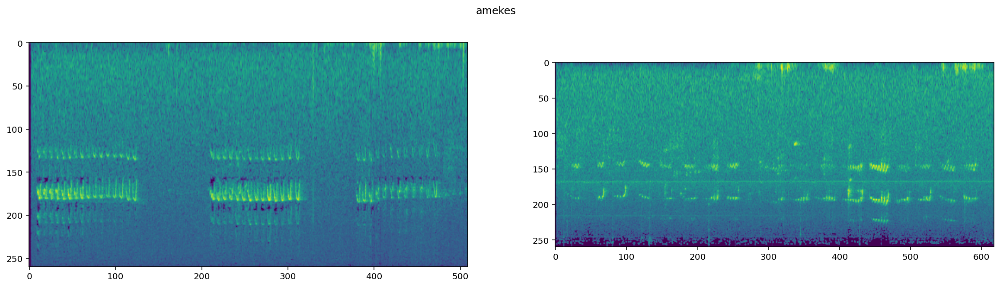

/app/_data/train_short_audio/amered/XC339961.ogg /app/_data/train_short_audio/amered/XC147175.ogg


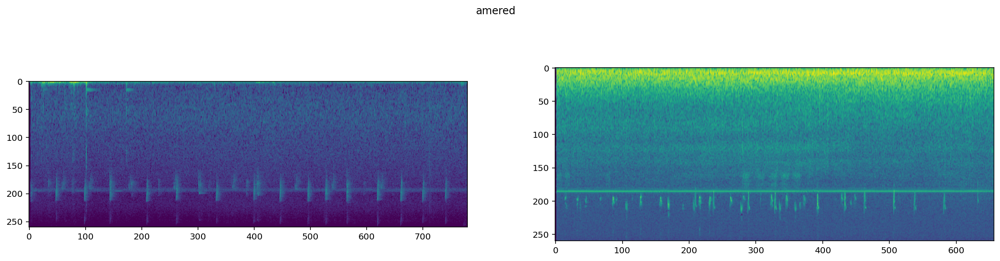

/app/_data/train_short_audio/andsol1/XC205779.ogg /app/_data/train_short_audio/andsol1/XC261034.ogg


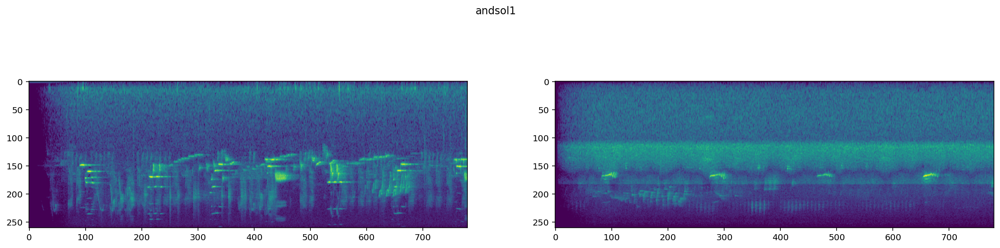

In [103]:
for i in COR_birds[3:6]:
    cor_file = COR[COR['primary_label']==i].sample()
    cor_wave,  _ = librosa.load(cor_file['file_path'].values[0], sr=32000)
    mel = librosa.feature.melspectrogram(cor_wave, sr=32000, n_mels=260, n_fft=2048, hop_length = 617, win_length = 1024, fmin = 0)
    mel = librosa.power_to_db(mel)    
    not_cor_file = audio_not_in_cor[audio_not_in_cor['primary_label']==i].sample()
    not_cor_wave, _ = librosa.load(not_cor_file['file_path'].values[0], sr=32000)
    not_cor_mel = librosa.feature.melspectrogram(not_cor_wave, sr=32000, n_mels=260, n_fft=2048, hop_length = 617, win_length = 1024, fmin = 0)
    not_cor_mel = librosa.power_to_db(not_cor_mel)
    print(cor_file['file_path'].values[0], not_cor_file['file_path'].values[0])
    plt.figure(figsize=(20,5))
    plt.suptitle(i)
    plt.subplot(1,2,1)
    plt.imshow(mel[:,:780])
    plt.subplot(1,2,2)
    plt.imshow(not_cor_mel[:,:780])
    plt.show();
plt.show();

In [97]:
COR.primary_label.value_counts().tail(50)

yerwar     3
carwre     2
norfli     2
eucdov     2
rotbec     2
blctan1    2
whimbr     2
labwoo     2
weskin     2
cubthr     2
prowar     2
greegr     2
eletro     2
comrav     2
paltan1    2
westan     2
y00475     2
macwar     2
wiltur     2
btbwar     2
blhpar1    2
robgro     2
buhvir     1
redcro     1
herwar     1
logshr     1
btnwar     1
lobdow     1
mouwar     1
stvhum2    1
cogdov     1
willet1    1
thbkin     1
coohaw     1
barswa     1
comyel     1
chswar     1
semplo     1
plaxen1    1
oliwoo1    1
linspa     1
veery      1
bushti     1
stejay     1
yelgro     1
wegspa1    1
aldfly     1
osprey     1
amered     1
moudov     1
Name: primary_label, dtype: int64

In [ ]:
['/app/_data/train_short_audio/acowoo/XC153315.ogg', '']

# noise

In [17]:
nocall[['file_path', 'row_id', 'end_sec']].head(10)
with_call[['file_path', 'row_id', 'end_sec']].head(10)

,file_path,row_id,end_sec
0,/app/_data/train_soundscapes/7019_COR_20190904...,7019_COR_5,5
1,/app/_data/train_soundscapes/7019_COR_20190904...,7019_COR_10,10
2,/app/_data/train_soundscapes/7019_COR_20190904...,7019_COR_15,15
3,/app/_data/train_soundscapes/7019_COR_20190904...,7019_COR_20,20
4,/app/_data/train_soundscapes/7019_COR_20190904...,7019_COR_25,25
5,/app/_data/train_soundscapes/7019_COR_20190904...,7019_COR_30,30
6,/app/_data/train_soundscapes/7019_COR_20190904...,7019_COR_35,35
7,/app/_data/train_soundscapes/7019_COR_20190904...,7019_COR_40,40
8,/app/_data/train_soundscapes/7019_COR_20190904...,7019_COR_45,45
9,/app/_data/train_soundscapes/7019_COR_20190904...,7019_COR_50,50


,file_path,row_id,end_sec
0,/app/_data/train_soundscapes/11254_COR_2019090...,11254_COR_5,5
1,/app/_data/train_soundscapes/11254_COR_2019090...,11254_COR_15,15
2,/app/_data/train_soundscapes/11254_COR_2019090...,11254_COR_25,25
3,/app/_data/train_soundscapes/11254_COR_2019090...,11254_COR_140,140
4,/app/_data/train_soundscapes/11254_COR_2019090...,11254_COR_145,145
5,/app/_data/train_soundscapes/11254_COR_2019090...,11254_COR_150,150
6,/app/_data/train_soundscapes/11254_COR_2019090...,11254_COR_155,155
7,/app/_data/train_soundscapes/11254_COR_2019090...,11254_COR_160,160
8,/app/_data/train_soundscapes/11254_COR_2019090...,11254_COR_165,165
9,/app/_data/train_soundscapes/11254_COR_2019090...,11254_COR_215,215


In [23]:
all_audio_init[['file_path', 'row_id', 'end_sec']].head(10)

,file_path,row_id,end_sec
0,/app/_data/train_short_audio/acafly/XC109605.ogg,NaN,5.0
1,/app/_data/train_short_audio/acafly/XC11209.ogg,NaN,5.0
2,/app/_data/train_short_audio/acafly/XC127032.ogg,NaN,5.0
3,/app/_data/train_short_audio/acafly/XC129974.ogg,NaN,5.0
4,/app/_data/train_short_audio/acafly/XC129981.ogg,NaN,5.0
5,/app/_data/train_short_audio/acafly/XC130056.ogg,NaN,5.0
6,/app/_data/train_short_audio/acafly/XC130133.ogg,NaN,5.0
7,/app/_data/train_short_audio/acafly/XC130140.ogg,NaN,5.0
8,/app/_data/train_short_audio/acafly/XC130750.ogg,NaN,5.0
9,/app/_data/train_short_audio/acafly/XC131193.ogg,NaN,5.0


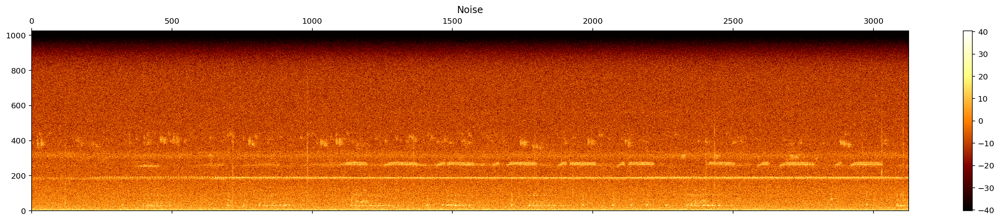

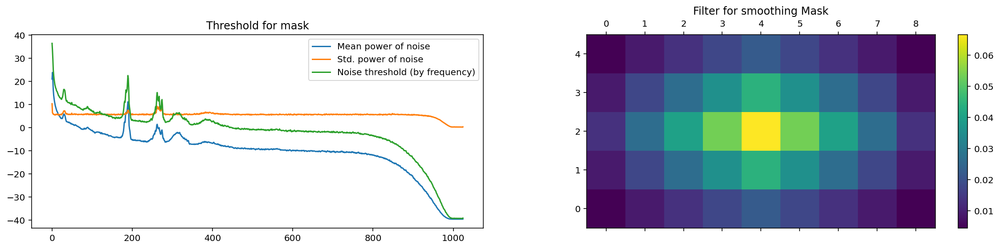

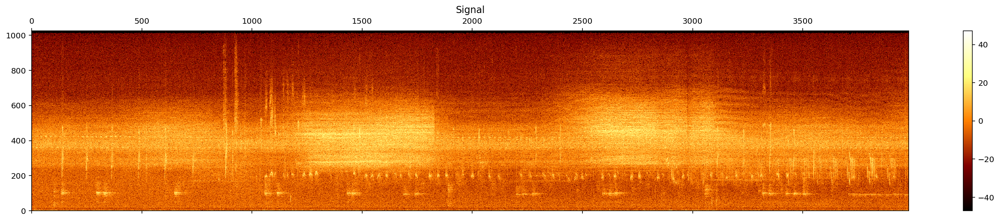

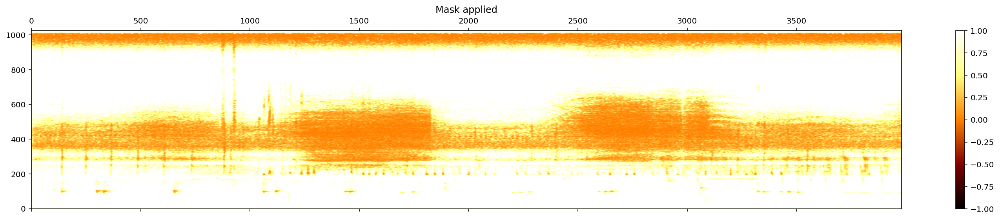

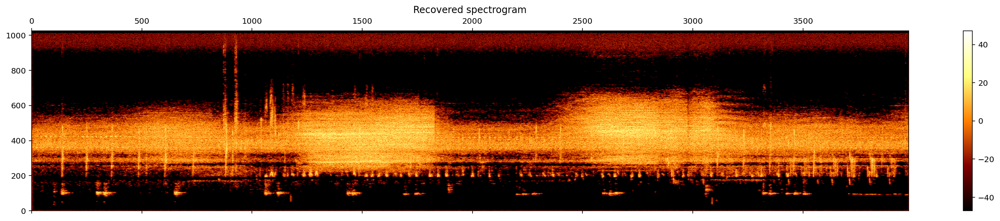

In [24]:
import noisereduce as nr 
#load data 
wave, _ = librosa.load(nocall['file_path'][0], sr=32000)
wave1, _ = librosa.load('/app/_data/train_short_audio/acafly/XC109605.ogg', sr=32000)

# select section of data that is noise 
noisy_part = wave[0*32000:50*32000] 
# perform noise reduction 
reduced_noise = nr.reduce_noise(audio_clip=wave1,noise_clip=noisy_part, verbose=True)

In [21]:
reduced_noise

array([-0.0343952 , -0.0201455 ,  0.02688718, ..., -0.00866093,
       -0.00500939, -0.02625521])